In [1]:
import sys
from pathlib import Path
import pandas as pd
from dotenv import load_dotenv

# 🔎 Busquem la carpeta arrel del projecte: "potato-dry-matter-optics-ml"
current_path = Path().resolve()
TARGET_ROOT_NAME = "potato-dry-matter-optics-ml"

while current_path.name != TARGET_ROOT_NAME and current_path.parent != current_path:
    current_path = current_path.parent

if current_path.name != TARGET_ROOT_NAME:
    raise RuntimeError(
        f"No s'ha trobat la carpeta '{TARGET_ROOT_NAME}' pujant des del directori actual: {Path().resolve()}"
    )

project_root = current_path
sys.path.append(str(project_root))

from src.raw_image_treatment import potato_pixels_rgb_img, potato_filter_extreme_colours

# Cargar variables de entorno (ROBOFLOW_API_KEY)
load_dotenv()

True

In [2]:
# Mateixa ruta que al contour_test.ipynb
IMAGE_REL_PATH = Path("data/input/raw/raw_images/test_1/p1_21.png")
IMAGE_PATH = project_root / IMAGE_REL_PATH

print(f"Processant imatge: {IMAGE_PATH}")

# Cridem la funció encapsulada
cropped_img, vis_img = potato_pixels_rgb_img(IMAGE_PATH, margin=0, )

# Carpeta de sortida (com al notebook original)
out_dir = project_root / "data/input/processed_images/test_0"
out_dir.mkdir(parents=True, exist_ok=True)

# Guardem la visualització
vis_path = out_dir / "p1_21_visualize_margin0.png"
vis_img.save(vis_path)
print(f"  → Imatge de visualització guardada a: {vis_path}")

# Guardem el cropped si existeix
if cropped_img is not None:
    cropped_path = out_dir / "p1_21_cut_margin0.png"
    cropped_img.save(cropped_path)
    print(f"  → CROPPED guardada: {cropped_path}")

    # 2) Filtre per color mediana i guardar al mateix out_dir
    median_filtered_path = out_dir / "p1_21_median_filtered_margin0.png"
    filtered_img = potato_filter_extreme_colours(
        cropped_img,
        margin=50,
        ignore_black=True,
    )
    filtered_img.save(median_filtered_path)
    print(f"  → MEDIAN FILTER guardada: {median_filtered_path}")

else:
    print("  [AVÍS] No s'ha detectat màscara; no es pot aplicar filtrat per mediana.")

Processant imatge: C:\Users\david\Desktop\Uni\potato-dry-matter-optics-ml\data\input\raw\raw_images\test_1\p1_21.png
  → Imatge de visualització guardada a: C:\Users\david\Desktop\Uni\potato-dry-matter-optics-ml\data\input\processed_images\test_0\p1_21_visualize_margin0.png
  → CROPPED guardada: C:\Users\david\Desktop\Uni\potato-dry-matter-optics-ml\data\input\processed_images\test_0\p1_21_cut_margin0.png
  → MEDIAN FILTER guardada: C:\Users\david\Desktop\Uni\potato-dry-matter-optics-ml\data\input\processed_images\test_0\p1_21_median_filtered_margin0.png


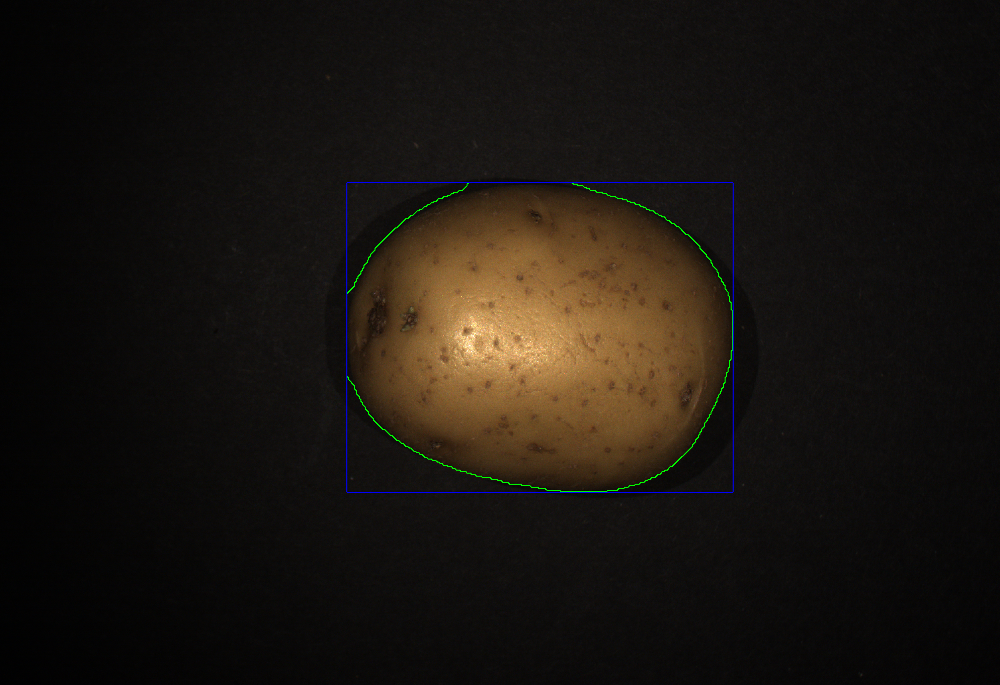

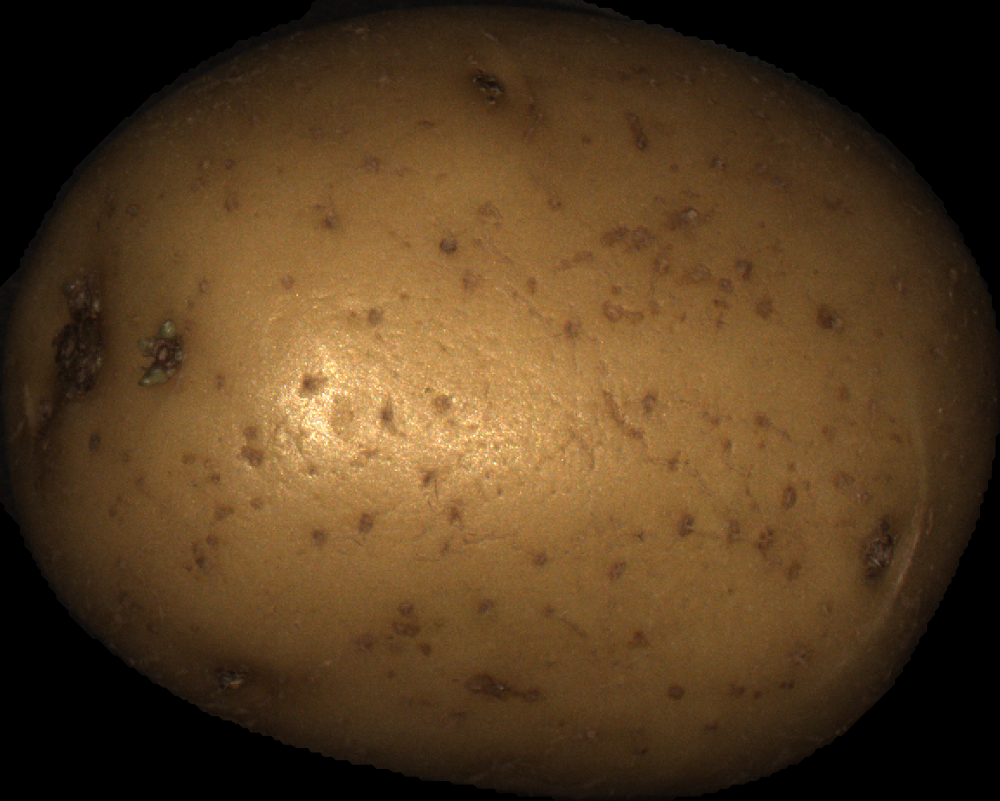

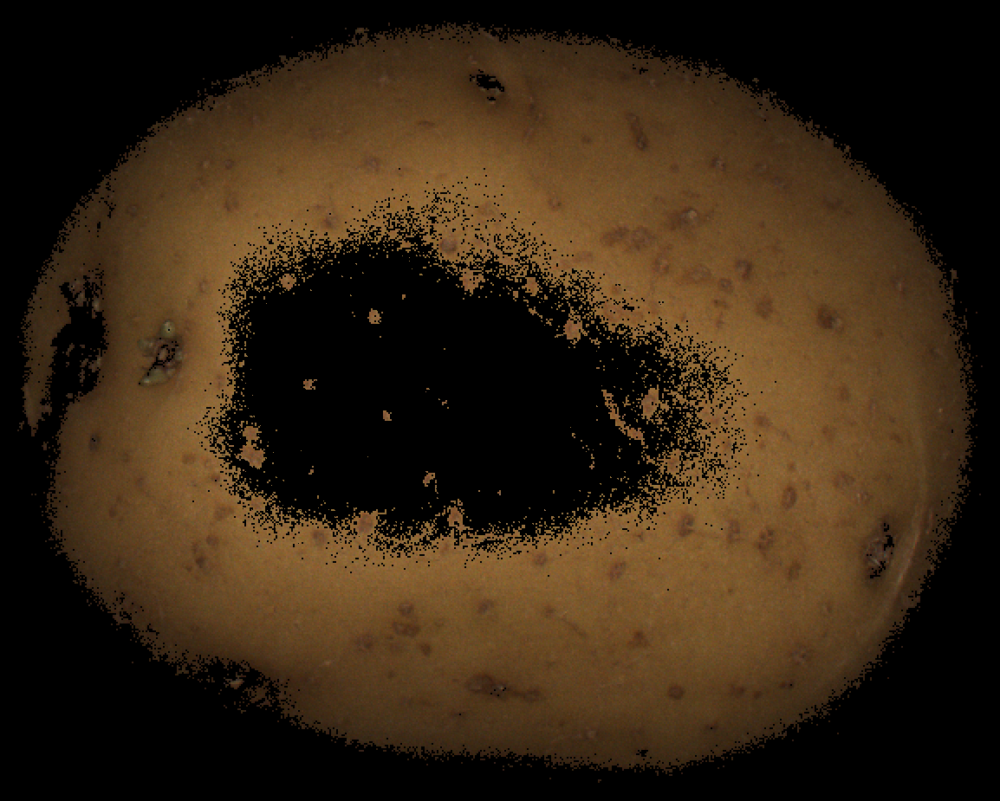

In [3]:
# Opcional: mostrar al notebook
display(vis_img)
if cropped_img is not None:
    display(cropped_img)
    display(filtered_img)